In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re
from sklearn.linear_model import LinearRegression

In [6]:
#emissions = pd.read_excel("data/essd_ghg_data_gwp100 (1).xlsx", sheet_name="data")
emissions = pd.read_excel("../data/edgar_v7_ghg_data_gwp100.xlsx", sheet_name="data")
#emissions = pd.read_excel('../data/EDGAR_AR5_GHG_1970_2022.xlsx')
emissions.loc[emissions["subsector_title"]=="Waste","sector_title"] = "Waste"
emissions.loc[emissions["sector_title"]=="Energy systems","sector_title"] = "Energy"
lulucf = pd.read_excel("../data/data_lulucf.xlsx", sheet_name="data").rename(columns={"mean": "GHG"})
lulucf["GHG"] *= 1e9
lulucf["sector_title"] = "AFOLU"
emissions = pd.concat([emissions, lulucf]) # Add LULUCF data to AFOLU (global only)
emissions

,iso,country,region_ar6_6,region_ar6_6_short,region_ar6_10,region_ar6_10_short,year,sector_title,subsector_title,CO2,CH4,N2O,Fgas,GHG,BLUE,H&N,OSCAR
0,ABW,Aruba,Latin America and Caribbean,LAM,Latin America and Caribbean,Latin Am.,1990,Buildings,Residential,26335.849995,366.820206,79.346807,0.0,2.678202e+04,NaN,NaN,NaN
1,ABW,Aruba,Latin America and Caribbean,LAM,Latin America and Caribbean,Latin Am.,1990,Energy,Electricity & heat,212235.419054,77.843285,267.675851,0.0,2.125809e+05,NaN,NaN,NaN
2,ABW,Aruba,Latin America and Caribbean,LAM,Latin America and Caribbean,Latin Am.,1990,Energy,Oil and gas fugitive emissions,0.024653,11.019916,0.000000,0.0,1.104457e+01,NaN,NaN,NaN
3,ABW,Aruba,Latin America and Caribbean,LAM,Latin America and Caribbean,Latin Am.,1990,Energy,Other (energy systems),176504.185100,806.262005,2793.849381,0.0,1.801043e+05,NaN,NaN,NaN
4,ABW,Aruba,Latin America and Caribbean,LAM,Latin America and Caribbean,Latin Am.,1990,Industry,Chemicals,1706.210733,0.000000,0.186633,0.0,1.706397e+03,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57,NaN,NaN,NaN,NaN,NaN,NaN,2016,AFOLU,NaN,NaN,NaN,NaN,NaN,3.706270e+09,4.242395,2.802191,4.074224
58,NaN,NaN,NaN,NaN,NaN,NaN,2017,AFOLU,NaN,NaN,NaN,NaN,NaN,3.665545e+09,4.448765,2.462021,4.085849
59,NaN,NaN,NaN,NaN,NaN,NaN,2018,AFOLU,NaN,NaN,NaN,NaN,NaN,3.860346e+09,4.891809,2.289334,4.399896
60,NaN,NaN,NaN,NaN,NaN,NaN,2019,AFOLU,NaN,NaN,NaN,NaN,NaN,3.828195e+09,4.567215,2.587574,4.329795


In [10]:
country_totals = emissions.query('year==2021').groupby("country")[["GHG"]].sum().reset_index()
country_totals['share'] = country_totals['GHG'] / country_totals['GHG'].sum()
country_totals.sort_values('GHG').tail()

,country,GHG,share
25,Brazil,1.361781e+09,0.025775
155,Russian Federation,2.593556e+09,0.049089
87,India,3.827166e+09,0.072437
199,United States,5.845764e+09,0.110643
38,China,1.534898e+10,0.290512


In [11]:
country_totals['GHG'].sum()

52834237494.37883

## Sector totals

In [12]:
sector_totals = emissions.query('year==2021').groupby("sector_title")[["GHG"]].sum().reset_index()
sector_totals.to_csv('../data/sector_emissions.csv', index=False)

sector_title
AFOLU        0.121358
Buildings    0.060535
Energy       0.391111
Industry     0.227514
Transport    0.153483
Waste        0.045998
Name: GHG, dtype: float64

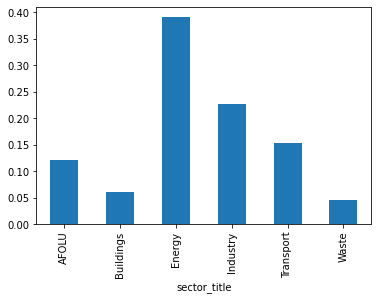

In [13]:
sector_totals = emissions.query('year==2021').groupby("sector_title")["GHG"].sum()
sector_totals /= sector_totals.sum()
sector_totals.plot.bar()
sector_totals

In [14]:
import pycountry_convert as pc
def get_cont(x):
    continents = {
        'NA': 'North America',
        'SA': 'South America', 
        'AS': 'Asia',
        'OC': 'Oceania',
        'AF': 'Africa',
        'EU': 'Europe'
    }
    try:
        return continents[pc.country_alpha2_to_continent_code(pc.country_alpha3_to_country_alpha2(x))]
    except:
        return None
    
emissions['continent'] = emissions['iso'].apply(lambda x: get_cont(x))
emissions.head()

,iso,country,region_ar6_6,region_ar6_6_short,region_ar6_10,region_ar6_10_short,year,sector_title,subsector_title,CO2,CH4,N2O,Fgas,GHG,BLUE,H&N,OSCAR,continent
0,ABW,Aruba,Latin America and Caribbean,LAM,Latin America and Caribbean,Latin Am.,1990,Buildings,Residential,26335.849995,366.820206,79.346807,0.0,26782.017008,NaN,NaN,NaN,North America
1,ABW,Aruba,Latin America and Caribbean,LAM,Latin America and Caribbean,Latin Am.,1990,Energy,Electricity & heat,212235.419054,77.843285,267.675851,0.0,212580.938190,NaN,NaN,NaN,North America
2,ABW,Aruba,Latin America and Caribbean,LAM,Latin America and Caribbean,Latin Am.,1990,Energy,Oil and gas fugitive emissions,0.024653,11.019916,0.000000,0.0,11.044569,NaN,NaN,NaN,North America
3,ABW,Aruba,Latin America and Caribbean,LAM,Latin America and Caribbean,Latin Am.,1990,Energy,Other (energy systems),176504.185100,806.262005,2793.849381,0.0,180104.296486,NaN,NaN,NaN,North America
4,ABW,Aruba,Latin America and Caribbean,LAM,Latin America and Caribbean,Latin Am.,1990,Industry,Chemicals,1706.210733,0.000000,0.186633,0.0,1706.397367,NaN,NaN,NaN,North America


In [15]:
sector_region_totals = emissions.query('year==2021').groupby(['sector_title','continent'])[['GHG']].sum().reset_index()
sector_region_totals.to_csv('../data/sector_region_emissions.csv', index=False)
sector_region_totals

,sector_title,continent,GHG
0,AFOLU,Africa,8.989528e+08
1,AFOLU,Asia,3.022752e+09
2,AFOLU,Europe,6.063932e+08
3,AFOLU,North America,6.859787e+08
4,AFOLU,Oceania,1.484583e+08
5,AFOLU,South America,1.042582e+09
6,Buildings,Africa,2.212450e+08
7,Buildings,Asia,1.400812e+09
8,Buildings,Europe,8.078102e+08
9,Buildings,North America,6.705961e+08


In [18]:
sector_df = (emissions
             .query('year==2021')
             .groupby(['sector_title','iso'])['GHG']
             .sum()
             .reset_index()#.merge(sector_papers).merge(policy_df)
            )
sector_df['country_GHG_share'] = sector_df['GHG'] / sector_df.groupby('iso')['GHG'].transform(sum)
sector_df['global_GHG_share'] = sector_df['GHG'] / sector_df.groupby('sector_title')['GHG'].transform(sum)
sector_df.to_csv('../data/country_sector_emissions.csv', index=False)
sector_df.query('iso=="AFG"')

/tmp/ipykernel_868013/1370836989.py:7: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  sector_df['country_GHG_share'] = sector_df['GHG'] / sector_df.groupby('iso')['GHG'].transform(sum)
/tmp/ipykernel_868013/1370836989.py:8: FutureWarning: The provided callable <built-in function sum> is currently using SeriesGroupBy.sum. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "sum" instead.
  sector_df['global_GHG_share'] = sector_df['GHG'] / sector_df.groupby('sector_title')['GHG'].transform(sum)


,sector_title,iso,GHG,country_GHG_share,global_GHG_share
0,AFOLU,AFG,1.537675e+07,0.480612,0.002398
195,Buildings,AFG,3.220538e+05,0.010066,0.000101
402,Energy,AFG,4.447674e+06,0.139015,0.000215
611,Industry,AFG,4.310674e+06,0.134733,0.000359
819,Transport,AFG,1.932192e+06,0.060392,0.000238
1028,Waste,AFG,5.604746e+06,0.175181,0.002306


## Emissions trends

In [19]:
gdp = pd.read_csv("../data/API_NY.GDP.MKTP.CD_DS2_en_csv_v2_4353236.csv", skiprows=4)
ycols = gdp.columns[4:-1]
gdp = (gdp
       .melt(id_vars="Country Code",var_name="year", value_vars=ycols, value_name="GDP")
       .rename(columns={"Country Code": "iso"})
       .sort_values(["iso","year"])
      )
gdp["year"] = gdp["year"].astype(int)
gdp

,iso,year,GDP
0,ABW,1960,NaN
266,ABW,1961,NaN
532,ABW,1962,NaN
798,ABW,1963,NaN
1064,ABW,1964,NaN
...,...,...,...
15427,ZWE,2017,1.758489e+10
15693,ZWE,2018,1.811554e+10
15959,ZWE,2019,1.928429e+10
16225,ZWE,2020,1.805117e+10


In [21]:
total_emissions = emissions.groupby(["iso","year","region_ar6_6","region_ar6_10"])["GHG"].sum().reset_index().merge(gdp)
total_emissions["intensity"] = total_emissions["GHG"]*1e3 / total_emissions["GDP"]
#total_emissions["intensity"] =  total_emissions["GDP"] / total_emissions["GHG"]
total_emissions["log_intensity"] = np.log(total_emissions["intensity"])
total_emissions["log_GHG"] = np.log(total_emissions["GHG"])
total_emissions["log_GDP"] = np.log(total_emissions["GDP"])
total_emissions = total_emissions
total_emissions

,iso,year,region_ar6_6,region_ar6_10,GHG,GDP,intensity,log_intensity,log_GHG,log_GDP
0,ABW,1990,Latin America and Caribbean,Latin America and Caribbean,5.507029e+05,7.648045e+08,0.720057,-0.328425,13.218951,20.455131
1,ABW,1991,Latin America and Caribbean,Latin America and Caribbean,6.484511e+05,8.720670e+08,0.743579,-0.296280,13.382342,20.586377
2,ABW,1992,Latin America and Caribbean,Latin America and Caribbean,7.499816e+05,9.586592e+08,0.782323,-0.245487,13.527804,20.681046
3,ABW,1993,Latin America and Caribbean,Latin America and Caribbean,7.226401e+05,1.083240e+09,0.667110,-0.404801,13.490667,20.803223
4,ABW,1994,Latin America and Caribbean,Latin America and Caribbean,7.910725e+05,1.245810e+09,0.634986,-0.454152,13.581145,20.943052
...,...,...,...,...,...,...,...,...,...,...
6235,ZWE,2017,Africa,Africa,2.894112e+07,1.758489e+10,1.645795,0.498223,17.180774,23.590306
6236,ZWE,2018,Africa,Africa,3.153691e+07,1.811554e+10,1.740876,0.554388,17.266669,23.620036
6237,ZWE,2019,Africa,Africa,3.113179e+07,1.928429e+10,1.614360,0.478939,17.253740,23.682557
6238,ZWE,2020,Africa,Africa,3.096080e+07,1.805117e+10,1.715169,0.539511,17.248233,23.616476


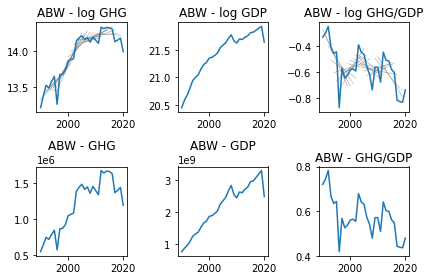

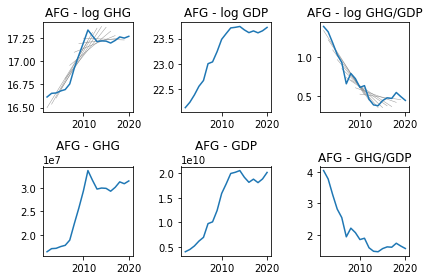

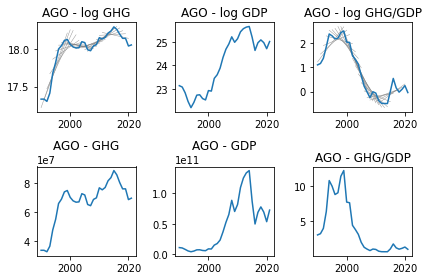

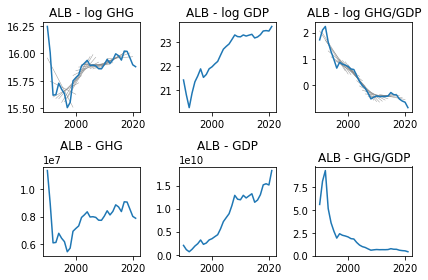

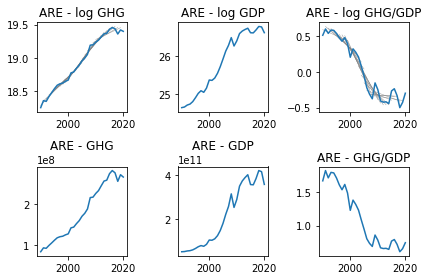

...

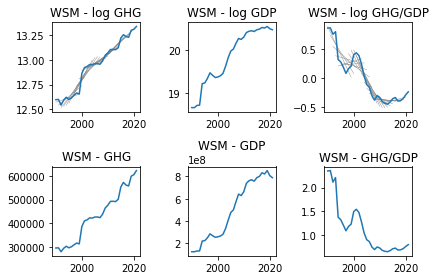

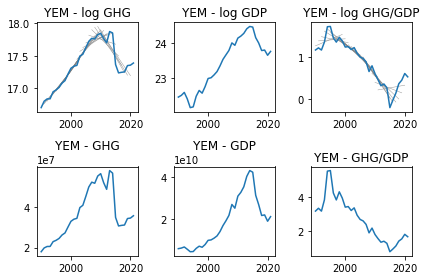

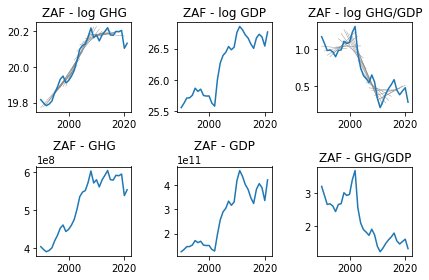

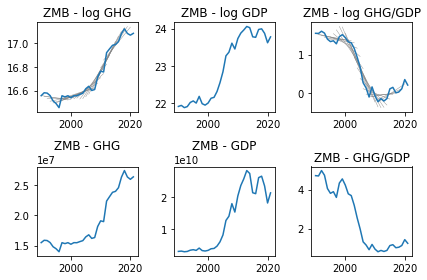

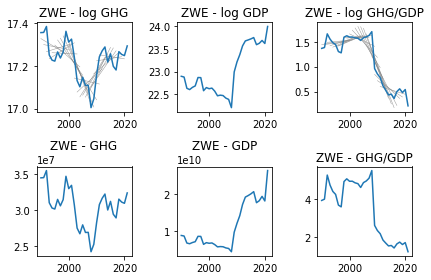

In [27]:
trends = []
period = 10
for country, group in total_emissions.groupby("iso"):
    fig, axs = plt.subplots(2, 3)
    group = group.dropna()
    for start_year in group.reset_index().index[:-period]:
        lm = LinearRegression()
        sub_years = group.iloc[start_year:start_year+period,:]
        X = np.array(sub_years.year).reshape(period,1)
        
        
        lm.fit(X, sub_years["log_GHG"])
        y_hat = lm.intercept_ + sub_years.year*lm.coef_
        axs[0,0].plot(sub_years.year, y_hat, color="grey", lw=0.5, alpha=0.8)
        
        ilm = LinearRegression()
        ilm.fit(X, sub_years["log_intensity"])
        y_hat = ilm.intercept_ + sub_years.year*ilm.coef_
        axs[0,2].plot(sub_years.year, y_hat, color="grey", lw=0.5, alpha=0.8)
        
        
        trends.append({
            "country_code3": country, 
            "GHG_trend":  lm.coef_[0],
            "intensity_trend":  ilm.coef_[0], 
            "start_year": sub_years.iloc[0].year}
        )
        
    axs[0,0].plot(group.year, group["log_GHG"])
    axs[0,1].plot(group.year, group["log_GDP"])
    axs[1,1].plot(group.year, group["GDP"])
    axs[0,2].plot(group.year, group["log_intensity"])
    axs[1,0].plot(group.year, group["GHG"])
    axs[1,2].plot(group.year, group["intensity"])
    axs[0,0].set_title(f"{country} - log GHG")
    axs[1,0].set_title(f"{country} - GHG")
    axs[0,2].set_title(f"{country} - log GHG/GDP")
    axs[1,2].set_title(f"{country} - GHG/GDP")
    axs[0,1].set_title(f"{country} - log GDP")
    axs[1,1].set_title(f"{country} - GDP")
    fig.tight_layout()
    plt.show()
    
trend_df = pd.DataFrame.from_dict(trends)
trend_df.to_csv('../data/emissions_trends.csv', index=False)

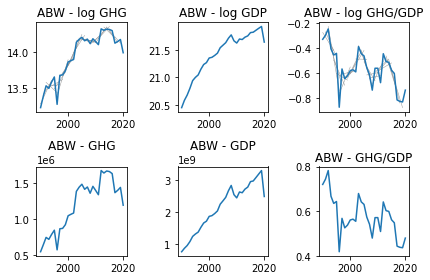

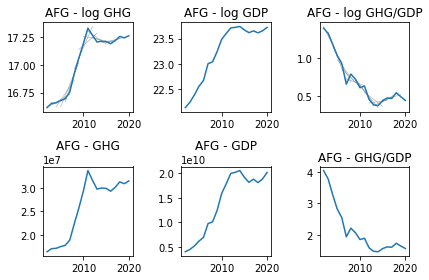

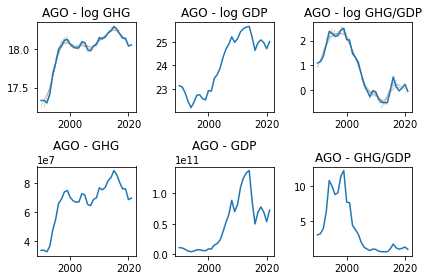

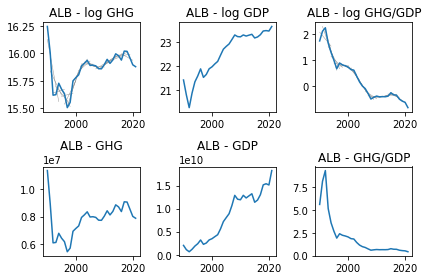

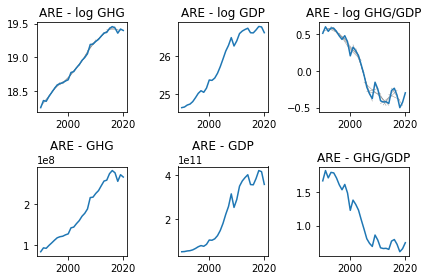

...

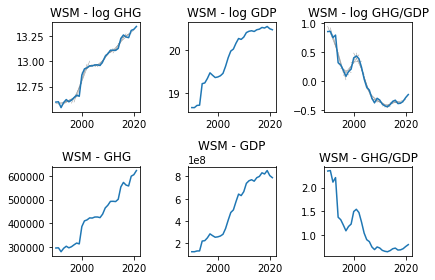

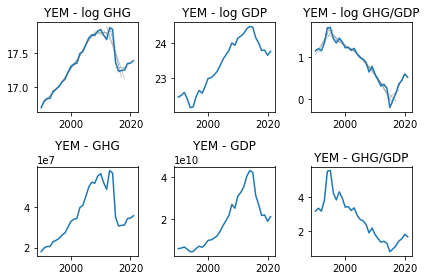

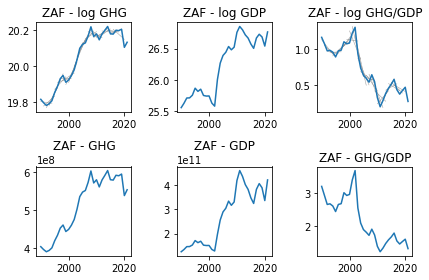

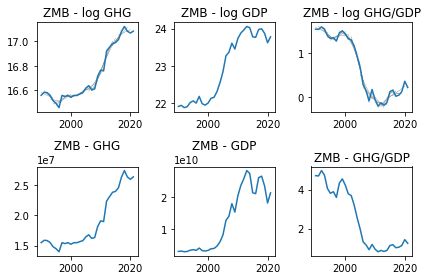

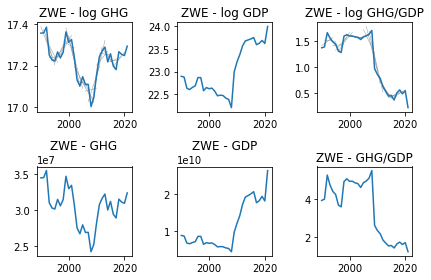

In [26]:
trends = []
period = 5
for country, group in total_emissions.groupby("iso"):
    fig, axs = plt.subplots(2, 3)
    group = group.dropna()
    for start_year in group.reset_index().index[:-period]:
        lm = LinearRegression()
        sub_years = group.iloc[start_year:start_year+period,:]
        X = np.array(sub_years.year).reshape(period,1)
        
        
        lm.fit(X, sub_years["log_GHG"])
        y_hat = lm.intercept_ + sub_years.year*lm.coef_
        axs[0,0].plot(sub_years.year, y_hat, color="grey", lw=0.5, alpha=0.8)
        
        ilm = LinearRegression()
        ilm.fit(X, sub_years["log_intensity"])
        y_hat = ilm.intercept_ + sub_years.year*ilm.coef_
        axs[0,2].plot(sub_years.year, y_hat, color="grey", lw=0.5, alpha=0.8)
        
        
        trends.append({
            "country_code3": country, 
            "GHG_trend":  lm.coef_[0],
            "intensity_trend":  ilm.coef_[0], 
            "start_year": sub_years.iloc[0].year}
        )
        
    axs[0,0].plot(group.year, group["log_GHG"])
    axs[0,1].plot(group.year, group["log_GDP"])
    axs[1,1].plot(group.year, group["GDP"])
    axs[0,2].plot(group.year, group["log_intensity"])
    axs[1,0].plot(group.year, group["GHG"])
    axs[1,2].plot(group.year, group["intensity"])
    axs[0,0].set_title(f"{country} - log GHG")
    axs[1,0].set_title(f"{country} - GHG")
    axs[0,2].set_title(f"{country} - log GHG/GDP")
    axs[1,2].set_title(f"{country} - GHG/GDP")
    axs[0,1].set_title(f"{country} - log GDP")
    axs[1,1].set_title(f"{country} - GDP")
    fig.tight_layout()
    plt.show()
    
trend_df = pd.DataFrame.from_dict(trends)
trend_df.to_csv('../data/emissions_trends_5.csv', index=False)